# Notebook to run basic analysis on processed data after cellbender

# Importing packages

In [1]:
import anndata as ad
import scanpy as sc
import os
import numba
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import median_abs_deviation

In [2]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 300, color_map = 'RdPu', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.10.8
scanpy      1.10.1
-----
PIL                 10.3.0
asttokens           NA
cffi                1.16.0
charset_normalizer  3.3.2
colorama            0.4.6
comm                0.2.2
cycler              0.12.1
cython_runtime      NA
dateutil            2.9.0.post0
debugpy             1.8.2
decorator           5.1.1
defusedxml          0.7.1
django              5.0.6
executing           2.0.1
h5py                3.11.0
igraph              0.11.5
ipykernel           6.29.5
ipython_genutils    0.2.0
ipywidgets          8.1.3
jedi                0.19.1
joblib              1.4.2
kiwisolver          1.4.5
legacy_api_wrap     NA
leidenalg           0.10.2
llvmlite            0.43.0
matplotlib          3.8.4
mpl_toolkits        NA
natsort             8.4.0
numba               0.60.0
numexpr             2.10.1
numpy               2.0.0
packaging           24.1
pandas              2.2.2
parso               0.8.4
patsy               0.5.6
platformdirs        4.2.2
plotly    

In [3]:
ref = sc.read_h5ad('../../data/ref_labelled_dmd.h5ad')
ref

/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 147345 × 32285
    obs: 'cell_source', 'cell_type', 'donor', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'cell_states', 'seed_labels', 'genotype', 'batch', 'doublet_scores', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'cell_type-broad', 'orig.ident', 'Age_group', 'BMI', 'COVID_severity', 'COVID_status', 'Ethnicity', 'Group', 'Sex', 'annotation_broad', 'annotation_detailed', 'sample_id', 'nCount_HTO', 'nFeature_HTO', 'HTO_classification', 'Library', 'CD45_Annotation', 'MPC_Annotation', 'compartment'
    obsm: 'X_scANVI', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'

In [4]:
sample_dirs = ['A9_2', 'A10_2', 'A11_2', 'A12_2','B1_2', 'B2_2']
cellbender_data = '../../cellbender/0.01_ambient/'

cellbender_file_paths = [os.path.join(cellbender_data, sample, f"{sample}_filtered.h5") for sample in sample_dirs]

In [5]:
processed_data = [sc.read_10x_h5(file_path) for file_path in cellbender_file_paths]

for adata in processed_data:
    adata.var_names_make_unique()

after_cb = ad.concat(processed_data, keys= sample_dirs, label= 'sample')
after_cb

reading ../../cellbender/0.01_ambient/A9_2/A9_2_filtered.h5
 (0:00:00)
reading ../../cellbender/0.01_ambient/A10_2/A10_2_filtered.h5


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


 (0:00:00)
reading ../../cellbender/0.01_ambient/A11_2/A11_2_filtered.h5


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


 (0:00:00)
reading ../../cellbender/0.01_ambient/A12_2/A12_2_filtered.h5


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


 (0:00:00)
reading ../../cellbender/0.01_ambient/B1_2/B1_2_filtered.h5


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


 (0:00:00)


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


reading ../../cellbender/0.01_ambient/B2_2/B2_2_filtered.h5


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


 (0:00:00)


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 188636 × 32285
    obs: 'sample'

In [6]:
after_cb.obs

,sample
CTTCAATCAATAGTCC-1,A9_2
GATGCTAAGCAGTAAT-1,A9_2
GCTACCTAGGTTGGTG-1,A9_2
GATTCTTCACACCTTC-1,A9_2
TAAGCCACATGAGAAT-1,A9_2
...,...
CTCATGCAGGTTGTTC-1,B2_2
TGATTCTTCTTGATTC-1,B2_2
TACGGTATCCCTCTTC-1,B2_2
CCTCCAATCCGATAAC-1,B2_2


In [7]:
after_cb.write_h5ad('../../cellbender/0.01_ambient/concat_cb_0.01_fpr_ambient.h5ad')

In [8]:
after_cb  = sc.read_h5ad('../../cellbender/0.01_ambient/concat_cb_0.01_fpr_ambient.h5ad') 
after_cb

/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/anndata/_core/anndata.py:1818: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 188636 × 32285
    obs: 'sample'

In [9]:
after_cb.obs_names_make_unique()
after_cb

AnnData object with n_obs × n_vars = 188636 × 32285
    obs: 'sample'

In [10]:
def X_is_raw(adata):
    return np.array_equal(adata.X.sum(axis=0).astype(int), adata.X.sum(axis=0))

is_raw = X_is_raw(after_cb)
print(is_raw)

True


In [11]:
after_cb.var["mt"] = after_cb.var_names.str.startswith("MT-")

after_cb.var["ribo"] = after_cb.var_names.str.startswith(("RPS", "RPL"))

In [12]:
sc.pp.calculate_qc_metrics(
    after_cb, qc_vars=["mt", "ribo"], inplace=True, percent_top=[20],log1p=True)
after_cb

AnnData object with n_obs × n_vars = 188636 × 32285
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [13]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

In [14]:
after_cb.obs["outlier"] = (
    is_outlier(after_cb, "log1p_total_counts", 5)
    | is_outlier(after_cb, "log1p_n_genes_by_counts", 5)
    | is_outlier(after_cb, "pct_counts_in_top_20_genes", 5)
)
after_cb.obs.outlier.value_counts()

outlier
False    163754
True      24882
Name: count, dtype: int64

In [15]:
print(f"Total number of cells: {after_cb.n_obs}")
after_cb = after_cb[(~after_cb.obs.outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {after_cb.n_obs}")

Total number of cells: 188636
Number of cells after filtering of low quality cells: 163754


In [16]:
sc.pp.normalize_total(after_cb, target_sum= 1e6)
sc.pp.log1p(after_cb)
after_cb.layers["normalized"] = after_cb.X.copy()

normalizing counts per cell
    finished (0:00:00)


In [17]:
sc.pp.highly_variable_genes(after_cb)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [18]:
after_cb

AnnData object with n_obs × n_vars = 163754 × 32285
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'normalized'

In [19]:
after_cb = after_cb[:, ~after_cb.var['highly_variable']]
after_cb.var.drop(columns='highly_variable', inplace=True)
after_cb.var

,mt,ribo,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,means,dispersions,dispersions_norm
Gm1992,False,False,321,0.002205,0.002203,99.829831,416,6.033086,5.202599e-01,7.305783,0.262695
Gm37381,False,False,76,0.000620,0.000620,99.959711,117,4.770685,1.006480e-01,7.169527,0.039026
Sox17,False,False,4348,0.030551,0.030094,97.695032,5763,8.659387,2.813925e+00,7.327984,-0.075033
Gm37587,False,False,292,0.001612,0.001610,99.845205,304,5.720312,4.932300e-01,7.004116,-0.232501
Gm37323,False,False,28,0.000159,0.000159,99.985157,30,3.433987,4.197443e-02,6.203032,-1.547505
...,...,...,...,...,...,...,...,...,...,...,...
AC124606.1,False,False,0,0.000000,0.000000,100.000000,0,0.000000,1.000000e-12,NaN,NaN
AC133095.2,False,False,0,0.000000,0.000000,100.000000,0,0.000000,1.000000e-12,NaN,NaN
AC133095.1,False,False,0,0.000000,0.000000,100.000000,0,0.000000,1.000000e-12,NaN,NaN
AC234645.1,False,False,0,0.000000,0.000000,100.000000,0,0.000000,1.000000e-12,NaN,NaN


In [20]:
ref.obs.index

Index(['ACACTGATCATTATCC-1-A9_2', 'TCTTCCTGTCATAACC-1-A9_2',
       'ATCTCTAGTTTCAGAC-1-A9_2', 'TGAATGCAGCTCCATA-1-A9_2',
       'GCAGCTGCACAAGTGG-1-A9_2', 'GAGACTTCAGTTAGAA-1-A9_2',
       'CCGATCTTCGCACGGT-1-A9_2', 'TAACTTCTCACAGAGG-1-A9_2',
       'CAACGATGTCTACGTA-1-A9_2', 'ATCGATGGTACCTAGT-1-A9_2',
       ...
       'TTTGACTCAGGCAATG-1_2-MDX_MPC-1', 'TTTGATCCATAACAGA-1_2-MDX_MPC-1',
       'TTTGATCGTCGTATTG-1_2-MDX_MPC-1', 'TTTGATCTCAAGTAAG-1_2-MDX_MPC-1',
       'TTTGGAGAGACTAAGT-1_2-MDX_MPC-1', 'TTTGGAGAGCGACTGA-1_2-MDX_MPC-1',
       'TTTGGAGAGGATAATC-1_2-MDX_MPC-1', 'TTTGGAGTCTCGGCTT-1_2-MDX_MPC-1',
       'TTTGTTGAGATTCGAA-1_2-MDX_MPC-1', 'TTTGTTGGTGATATAG-1_2-MDX_MPC-1'],
      dtype='object', length=147345)

In [21]:
after_cb.obs.index

Index(['CTAACCCCAAGCTCTA-1', 'TTAGGCAAGTAACCGG-1', 'CAGATACTCCTTCACG-1',
       'AGTGACTCAAGGCCTC-1', 'GTCAAACTCTTCCCGA-1', 'GCTGAATCACTTCTCG-1',
       'TTCACGCGTCCAAAGG-1', 'TAAGCCACAACGATCT-1', 'CAGTTAGGTCCACACG-1',
       'CTCATCGGTCACCCTT-1',
       ...
       'CAAGCTAGTATACAGA-1', 'GCGATCGTCAAGCCCG-1', 'CAGATCACAATTAGGA-1',
       'CCTTCAGAGGTTCTAC-1', 'TCCTCCCTCTTCTTCC-1-3', 'TCCTTCTTCTTTCTTC-1-1',
       'ACCGTTCTCTACTATC-1', 'TTCTCTCTCCCTCTCT-1-1', 'CTATAGGTCATCACTC-1',
       'AGCGTCGTCTCGCAGG-1'],
      dtype='object', length=163754)

In [22]:
ref_barcodes = pd.DataFrame(ref.obs.index, columns= ['barcodes'])
ref_barcodes

,barcodes
0,ACACTGATCATTATCC-1-A9_2
1,TCTTCCTGTCATAACC-1-A9_2
2,ATCTCTAGTTTCAGAC-1-A9_2
3,TGAATGCAGCTCCATA-1-A9_2
4,GCAGCTGCACAAGTGG-1-A9_2
...,...
147340,TTTGGAGAGCGACTGA-1_2-MDX_MPC-1
147341,TTTGGAGAGGATAATC-1_2-MDX_MPC-1
147342,TTTGGAGTCTCGGCTT-1_2-MDX_MPC-1
147343,TTTGTTGAGATTCGAA-1_2-MDX_MPC-1


In [23]:
def clean_ref(barcode):
    return barcode.rsplit('-', 1)[0] 

In [24]:
ref_barcodes['cleaned_barcodes'] = ref_barcodes['barcodes'].apply(clean_ref)
ref_barcodes['cell_type-broad'] = ref.obs['cell_type-broad'].values
ref_barcodes

,barcodes,cleaned_barcodes,cell_type-broad
0,ACACTGATCATTATCC-1-A9_2,ACACTGATCATTATCC-1,cardiomyocytes
1,TCTTCCTGTCATAACC-1-A9_2,TCTTCCTGTCATAACC-1,cardiomyocytes
2,ATCTCTAGTTTCAGAC-1-A9_2,ATCTCTAGTTTCAGAC-1,cardiomyocytes
3,TGAATGCAGCTCCATA-1-A9_2,TGAATGCAGCTCCATA-1,cardiomyocytes
4,GCAGCTGCACAAGTGG-1-A9_2,GCAGCTGCACAAGTGG-1,cardiomyocytes
...,...,...,...
147340,TTTGGAGAGCGACTGA-1_2-MDX_MPC-1,TTTGGAGAGCGACTGA-1_2-MDX_MPC,myeloid
147341,TTTGGAGAGGATAATC-1_2-MDX_MPC-1,TTTGGAGAGGATAATC-1_2-MDX_MPC,myeloid
147342,TTTGGAGTCTCGGCTT-1_2-MDX_MPC-1,TTTGGAGTCTCGGCTT-1_2-MDX_MPC,myeloid
147343,TTTGTTGAGATTCGAA-1_2-MDX_MPC-1,TTTGTTGAGATTCGAA-1_2-MDX_MPC,myeloid


In [25]:
after_cb_barcodes = pd.DataFrame(after_cb.obs.index, columns= ['barcodes'])
after_cb_barcodes

,barcodes
0,CTAACCCCAAGCTCTA-1
1,TTAGGCAAGTAACCGG-1
2,CAGATACTCCTTCACG-1
3,AGTGACTCAAGGCCTC-1
4,GTCAAACTCTTCCCGA-1
...,...
163749,TCCTTCTTCTTTCTTC-1-1
163750,ACCGTTCTCTACTATC-1
163751,TTCTCTCTCCCTCTCT-1-1
163752,CTATAGGTCATCACTC-1


In [26]:
mapping_dict = pd.Series(ref_barcodes['cell_type-broad'].values, index=ref_barcodes['cleaned_barcodes']).to_dict()
mapping_dict

{'ACACTGATCATTATCC-1': 'cardiomyocytes',
 'TCTTCCTGTCATAACC-1': 'cardiomyocytes',
 'ATCTCTAGTTTCAGAC-1': 'cardiomyocytes',
 'TGAATGCAGCTCCATA-1': 'cardiomyocytes',
 'GCAGCTGCACAAGTGG-1': 'cardiomyocytes',
 'GAGACTTCAGTTAGAA-1': 'cardiomyocytes',
 'CCGATCTTCGCACGGT-1': 'cardiomyocytes',
 'TAACTTCTCACAGAGG-1': 'cardiomyocytes',
 'CAACGATGTCTACGTA-1': 'cardiomyocytes',
 'ATCGATGGTACCTAGT-1': 'cardiomyocytes',
 'TTTGGTTCATCAACCA-1': 'cardiomyocytes',
 'AATCGTGAGAATTTGG-1': 'cardiomyocytes',
 'CTTCCGAGTCCCAAAT-1': 'cardiomyocytes',
 'AATTCCTTCACCGACG-1': 'cardiomyocytes',
 'TAGAGTCCACACCTTC-1': 'cardiomyocytes',
 'ATTCACTTCCTCACTG-1': 'cardiomyocytes',
 'GTTCCGTTCCCTCGTA-1': 'cardiomyocytes',
 'GACGTTAAGGAAAGGT-1': 'cardiomyocytes',
 'TCACATTCATTCACCC-1': 'cardiomyocytes',
 'CATTGCCCACGACGCT-1': 'cardiomyocytes',
 'GATCACATCGCTTAAG-1': 'lymphoid',
 'AACCTGAGTCACTCAA-1': 'cardiomyocytes',
 'CTACTATGTAGCGATG-1': 'cardiomyocytes',
 'CACAACATCGTTCTAT-1': 'cardiomyocytes',
 'GTGAGCCAGACGTCCC-1':

In [27]:
after_cb_barcodes['cell_type-broad'] = after_cb_barcodes['barcodes'].map(mapping_dict).fillna('Unknown')

after_cb.obs['cell_type-broad'] = after_cb_barcodes['cell_type-broad'].values

after_cb.obs['cell_type-broad'].value_counts()

cell_type-broad
Unknown            75826
lymphoid           49365
vascular states    15616
myeloid            15557
fibroblasts         4564
cardiomyocytes      2826
Name: count, dtype: int64

In [28]:
after_cb = after_cb[after_cb.obs['cell_type-broad'] != 'Unknown']

after_cb.obs['cell_type-broad'].value_counts()

cell_type-broad
lymphoid           49365
vascular states    15616
myeloid            15557
fibroblasts         4564
cardiomyocytes      2826
Name: count, dtype: int64

In [29]:
after_cb

View of AnnData object with n_obs × n_vars = 87928 × 26304
    obs: 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'outlier', 'cell_type-broad'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'normalized'

In [30]:
sc.pp.pca(after_cb)
sc.pp.neighbors(after_cb)
sc.tl.umap(after_cb)

computing PCA
    with n_comps=50


/home/skolla/miniforge3/envs/scanpy/lib/python3.12/site-packages/scanpy/preprocessing/_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm["X_pca"] = X_pca


    finished (0:00:41)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:23)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:30)


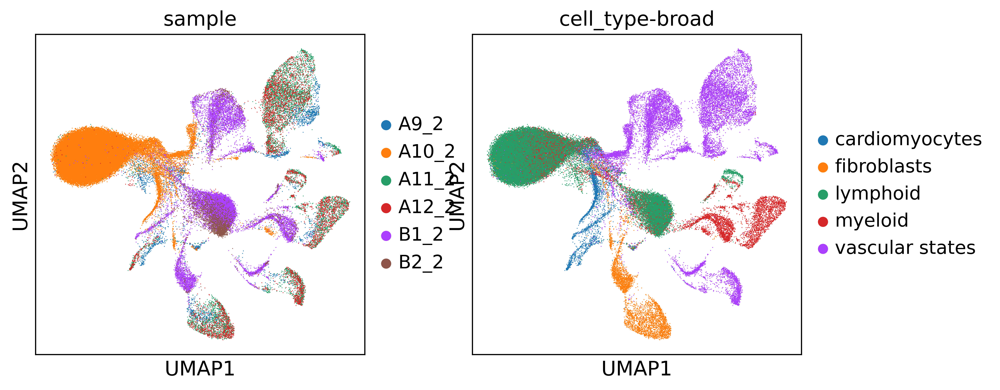

In [32]:
sc.pl.umap(after_cb, color= ['sample','cell_type-broad'])
sc.pl.umap(after_cb, color = ['Tnnt2', 'Ttn','Dcn','Myh7', 'Dmd','Ctnna3','Lama2','Ryr2', 'Cd44'])

In [33]:
genes_of_interest = ['Il2','Tnnt2','Il10', 'Ttn','Dcn','Myh7', 'Dmd','Ctnna3','Lama2','Ryr2', 'Cd44']

present_genes = [gene for gene in genes_of_interest if gene in after_cb.var.index]

before_cb_interested = after_cb[:, present_genes].X.sum(axis=0).A1

counts_df = pd.DataFrame({'Gene': present_genes, 'Total Count': before_cb_interested})
counts_df

,Gene,Total Count
0,Il2,332.493114
1,Tnnt2,601617.652700
2,Ttn,435502.460087
3,Dcn,313182.572232
4,Myh7,37704.451466
5,Dmd,128003.248376
6,Ctnna3,62545.605582
7,Lama2,105231.551295
8,Ryr2,203808.568554
9,Cd44,27429.555065


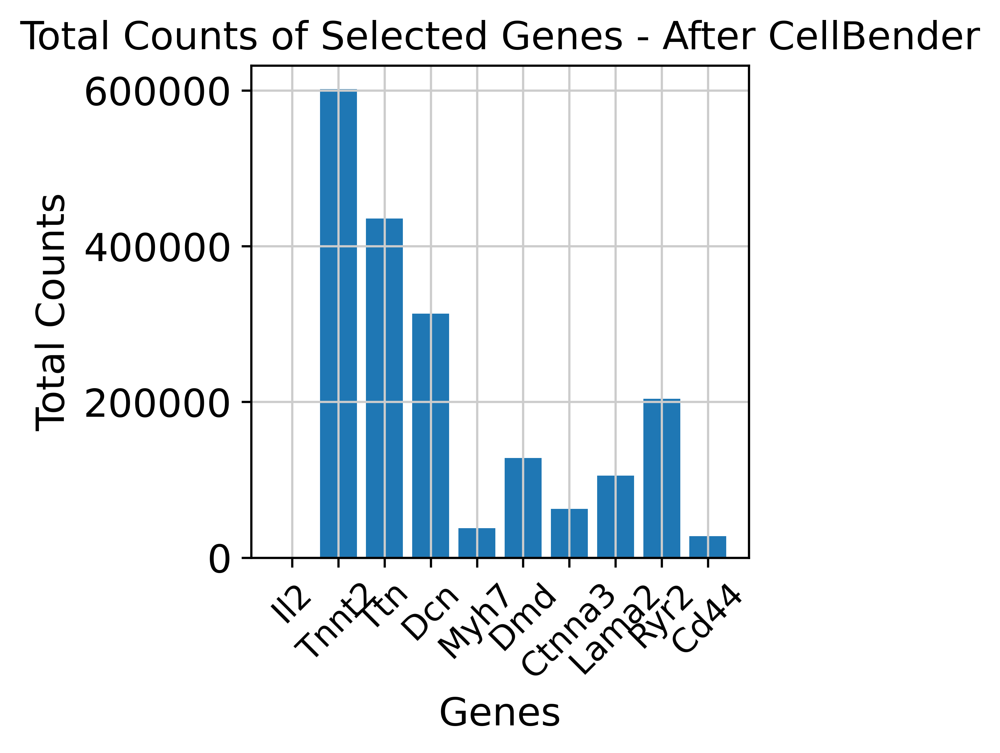

In [34]:
plt.bar(counts_df['Gene'], counts_df['Total Count'])
plt.title('Total Counts of Selected Genes - After CellBender')
plt.xlabel('Genes')
plt.ylabel('Total Counts')
plt.xticks(rotation=45, fontsize = 12)
plt.tight_layout()
plt.show()

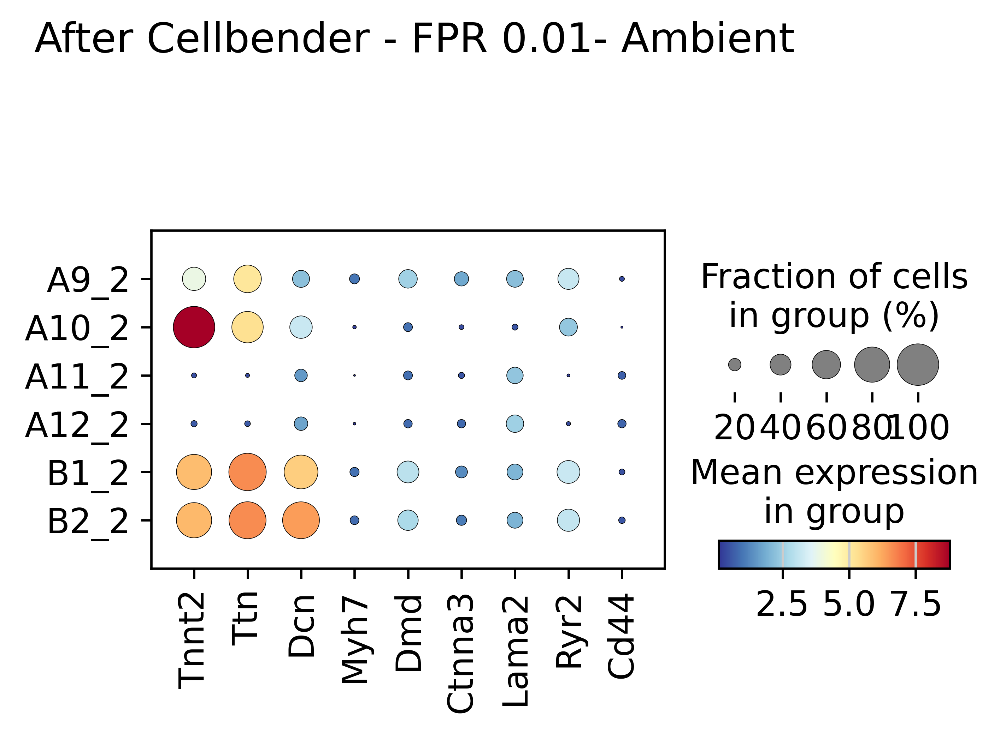

In [37]:
sc.pl.dotplot(after_cb, var_names= ['Tnnt2', 'Ttn','Dcn','Myh7', 'Dmd','Ctnna3','Lama2','Ryr2', 'Cd44'], groupby= 'sample', cmap= 'RdYlBu_r', title= ' After Cellbender - FPR 0.01- Ambient')